<a href="https://colab.research.google.com/github/itaywasser/final_project/blob/main/2024_final_project_Level_set.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import math
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from zipfile import ZipFile
from sklearn.model_selection import train_test_split
from skimage import filters
import skimage
import cv2
from IPython.display import HTML
from base64 import b64encode

##Center Surround filtering

In [ ]:
def Cen_Sur(center_rho, surround_rho):
  #return Center and Surround kernels
  #center_rho - diameter of the center region
  #surround_rho - outer diameter of the surround region

  center_kernel = Create_gaussian_kernel(center_rho)
  surround_kernel = Create_gaussian_kernel(surround_rho)
  surround_kernel = surround_kernel * Rectangular_Ring(center_rho, surround_rho)

  #normlize
  center_kernel = center_kernel / np.sum(center_kernel)
  surround_kernel= surround_kernel / np.sum(surround_kernel)

  return (center_kernel, surround_kernel)

In [ ]:
def Create_gaussian_kernel(rho):
    #creates gaussian kernel with side length 'rho' and decay coefficient 'rho'

    ax = np.linspace(-(rho//2), (rho - 1)//2, rho)
    gauss = np.exp(-np.square(ax) / np.square(rho))
    kernel = np.outer(gauss, gauss)
    return kernel

In [ ]:
def Rectangular_Ring(r_inner, r_outer):
  #return a rectangular ring with inner diameter 'r_inner' and outer diameter 'r_outer'

  diff = (r_outer - r_inner)
  surround_mask = np.ones((r_outer, r_outer))
  surround_mask[(diff + 1)//2 : -(diff//2), (diff + 1)//2 : -(diff//2)] = 0.0
  return surround_mask

##Useful functions

In [ ]:
def MS_avg(img_list):
    ms_avg = np.average(np.sign(img_list)*(img_list**2), axis=0)
    ms_avg = np.sign(ms_avg)*(np.abs(ms_avg)**(0.5))
    return ms_avg

In [ ]:
def norm(img, min, max):
      return ((img - np.min(img))/(np.max(img) - np.min(img)))*(max-min) + min

In [ ]:
def calc_res(image, center_rho, surround_rho):
    center_kernel, surround_kernel = Cen_Sur(center_rho, surround_rho)
    L_center = signal.convolve2d(image, center_kernel, mode='same', boundary='symm')
    L_surround = signal.convolve2d(image, surround_kernel, mode='same', boundary='symm')
    return L_center, L_surround

In [ ]:
def calc_res_list(image, center_rho_list, surround_rho_list):
    res_list = [calc_res(image, center_rho, surround_rho) for center_rho, surround_rho in zip(center_rho_list, surround_rho_list)]
    return res_list

In [ ]:
# Function to create the video
def create_video(frames, output_filename='segmentation_video.mp4', fps=10):
    height, width, layers = frames[0].shape
    size = (width, height)

    # Initialize video writer
    out = cv2.VideoWriter(output_filename, cv2.VideoWriter_fourcc(*'mp4v'), fps, size)

    # Write each frame to the video
    for frame in frames:
        out.write(frame)

    out.release()

##The special characteristics of brain tumor

###MSRB - Multi Scale Relative Brightness

In [ ]:
def MSRB(img, MSRB_rho):
  #return a Multi Scale Relative Brightness map of the input image

  res_MSRB = calc_res_list(img, list(MSRB_rho[0]), list(MSRB_rho[1]))
  MSRB_res = np.asarray([center/(surround + 0.000001) for center, surround in res_MSRB])
  MSRB_img = MS_avg(MSRB_res)
  return norm(MSRB_img, 0, 1)
  #return MSRB_img

###MSB - Multi Scale Brightness

In [ ]:
def MSB(image, rho_list):
  #return a Multi Scale Brightness map of the input image

  L_avg = [Brightness(image, rho) for rho in rho_list]
  MSB_list = np.asarray(L_avg)
  MSB_img = np.average(MSB_list**2, axis=0)**0.5
  return MSB_img/np.max(MSB_img)
  #return (MSB_img - np.min(MSB_img))/(np.max(MSB_img) - np.min(MSB_img))
  #return MSB_img

In [ ]:
def Brightness(image, rho):
  #return a Brightness map of the input image

  kernel = Create_gaussian_kernel(rho)
  kernel = kernel/np.sum(kernel)
  L = signal.convolve2d(image, kernel, mode='same', boundary='symm')
  return L

###MST - Multi Scale Texture




In [ ]:
def MST(img, MST_rho):
    #return a Multi Scale Texture map of the input image

    res_list = calc_res_list(img, list(MST_rho[0]), list(MST_rho[1]))
    MST_res = np.asarray([center - surround for center, surround in res_list])
    MST_img = MS_avg(MST_res)
    return MST_img/np.max(np.abs(MST_img))
    #return norm(MST_img, 0, 1)
    #return MST_img

###MSLV - Multi Scale Local Variance

In [ ]:
def MSLV(image, rho_list):
    L_avg = [Brightness(image**2, rho) - Brightness(image, rho)**2 for rho in rho_list]
    local_var_res = np.asarray(L_avg)
    local_var_img = MS_avg(local_var_res)
    return norm(local_var_img, 0, 1)
    #return local_var_img

##Main Algorithm

In [ ]:
def Heaviside(LSF, epsilon):
  #Apply the Heaviside function on the Level-Set function

  heav = 0.5*( 1 + (2/np.pi) * np.arctan(LSF/epsilon))
  return heav

In [ ]:
def Delta(LSF, epsilon):
  #Apply the Delta function on the Level-Set function

  delta = 1/np.pi * epsilon/(epsilon**2 + LSF**2)
  return delta

In [ ]:
def calc_mean(LSF, img, epsilon):
  #Calc the mean inside and outside of the contour

  heav = Heaviside(LSF, epsilon)
  c_in = np.sum(img*heav)/np.sum(heav)
  c_out = np.sum(img*(1-heav))/np.sum(1-heav)
  return (c_in, c_out)

In [ ]:
def Length_Pen(LSF, mu):
  #Calc the Penalty on the Length of the contour

  Iy, Ix = np.gradient(LSF)
  s = np.sqrt(Ix**2 + Iy**2)
  Ix = Ix/(s + 0.000001)
  Iy = Iy/(s + 0.000001)
  Ixx = np.gradient(Ix, axis=1)
  Iyy = np.gradient(Iy, axis=0)
  len_pen = Ixx + Iyy
  return mu*len_pen

In [ ]:
def Char_Pen(LSF, img, epsilon, lambda_list):
  #Calc the Penalty on the special characteristics of brain tumor

  c_in, c_out = calc_mean(LSF, img, epsilon)
  d_1 = (img-c_in)**2
  d_2 = (img-c_out)**2
  #d_1 = norm(d_1, 0, 1)
  #d_2 = norm(d_2, 0, 1)
  pen = lambda_list[0]*(d_1) + lambda_list[1]*(d_2)
  return pen

In [ ]:
def Char_Imgs(img, rho_dict):


    MSRB_rho = list(zip(*rho_dict['MSRB']))
    MSRB_img = MSRB(img, MSRB_rho)

    MST_rho = list(zip(*rho_dict['MSRB']))
    MST_img = MST(img, MST_rho)

    MSB_img  = MSB(img, rho_dict['MSB'])

    MSLV_img = MSLV(img, rho_dict['MSLV'])
    return MSRB_img, MSB_img, MST_img, MSLV_img

In [ ]:
def step(LSF, F_imgs, step_size, epsilon, mu, rho_dict, lambda_dict):
    MSRB_Pen = Char_Pen(LSF, F_imgs[0], epsilon, lambda_dict['MSRB'])
    MSB_Pen = Char_Pen(LSF, F_imgs[1], epsilon, lambda_dict['MSB'])
    MST_Pen = Char_Pen(LSF, F_imgs[2], epsilon, lambda_dict['MST'])
    Local_VAR_Pen = Char_Pen(LSF, F_imgs[3], epsilon, lambda_dict['MSLV'])
    Len_Pen = Length_Pen(LSF, mu)
    #print(np.mean((MSRB_Pen[mask_to_run==1])), np.mean((MSRB_Pen[(mask_dilated - mask_to_run)==1])))
    #print(np.mean((MSB_Pen[mask_to_run==1])), np.mean((MSB_Pen[(mask_dilated - mask_to_run)==1])))
    #print(np.mean((MST_Pen[mask_to_run==1])), np.mean((MST_Pen[(mask_dilated - mask_to_run)==1])))
    #print(np.mean((Local_VAR_Pen[mask_to_run==1])), np.mean((Local_VAR_Pen[(mask_dilated - mask_to_run)==1])))
    #np.mean(np.abs(MSB_Pen)), np.mean(np.abs(MST_Pen)),  np.mean(np.abs(Local_VAR_Pen)), np.mean(np.abs(Len_Pen)))
    #print(np.max(np.abs(MSRB_Pen + MSB_Pen + MST_Pen)))
    Pen_tot = MSRB_Pen + MSB_Pen + MST_Pen + Local_VAR_Pen + Len_Pen
    #plt.imshow(Pen_tot)
    #plt.show(block=False)
    delta = Delta(LSF, epsilon)
    LSF = LSF + step_size * delta * Pen_tot
    return LSF

In [ ]:
def mod_test(LSF, Image ,img, step_size, epsilon, mu, rho_dict, lambda_dict, n_iter):
    F_imgs = Char_Imgs(img, rho_dict)
    frames = []
    fig = plt.figure()
    plt.imshow(Image, cmap="gray")
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.contour(LSF, [0], colors='r')
    plt.show(block=False)

    # Save the plot to an image in memory
    fig.savefig('frame.png',bbox_inches='tight', pad_inches=0, dpi=fig.dpi)
    plt.close()

    # Read the saved image and append to the frames list
    frame = cv2.imread("frame.png")
    frames.append(frame)

    for i in range(n_iter):
      LSF = step(LSF, F_imgs, step_size, epsilon, mu, rho_dict, lambda_dict)
      if i %5 ==0:
        fig = plt.figure()
        plt.imshow(Image, cmap="gray")
        plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
        plt.contour(LSF, [0], colors='r')
        plt.show(block=False)

        # Save the plot to an image in memory
        fig.savefig('frame.png',bbox_inches='tight', pad_inches=0, dpi=fig.dpi)
        plt.close()

        # Read the saved image and append to the frames list
        frame = cv2.imread("frame.png")
        frames.append(frame)

    # Create the video
    create_video(frames)
    return LSF

##Pre processing


In [ ]:
test_data_path = r'/content/data LS test'

with ZipFile(test_data_path + ".zip", 'r') as zObject:
  zObject.extractall(path=test_data_path)

In [ ]:
image = np.load(r"/content/data LS test/404/image.npy")
mask = np.load(r"/content/data LS test/404/tumor_mask.npy")

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
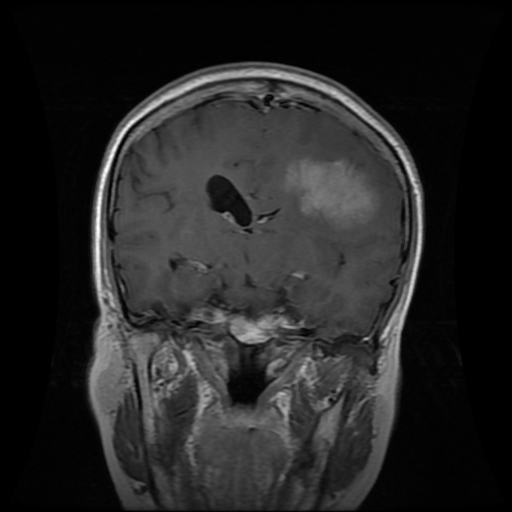

In [ ]:
skimage.exposure.rescale_intensity(image, out_range=np.uint8)

In [ ]:
y, x = np.where(mask)
y_min, y_max = np.min(y), np.max(y)
x_min, x_max = np.min(x), np.max(x)

In [ ]:
x_mid = (x_min + x_max)//2 - x_min + 60
y_mid = (y_min + y_max)//2 - y_min + 60

In [ ]:
img_to_run = image[y_min-60:y_max+60, x_min-60:x_max+30]
mask_to_run = mask[y_min-60:y_max+60, x_min-60:x_max+30]

In [ ]:
kernel = np.ones((1, 1))
mask_dilated = cv2.dilate(mask_to_run.astype(np.uint8), kernel)

In [ ]:
xb_min = 40
xb_max = 30 + x_max - x_min + xb_min
yb_min = 35
yb_max = 50 + y_max - y_min + yb_min

In [ ]:
init_LSF = (np.ones_like(mask_dilated)*-10).astype(np.float64)
init_LSF[yb_min:yb_max, xb_min:xb_max] = 0.000001
init_LSF[mask_dilated==1] = 1

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
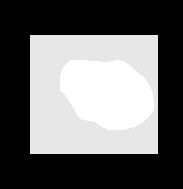

In [ ]:
skimage.exposure.rescale_intensity(init_LSF, out_range=np.uint8)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
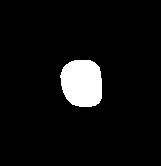

In [ ]:
skimage.exposure.rescale_intensity(mask_to_run, out_range=np.uint8)

###Parameters

In [ ]:
mu = 0.1
num = 300
epsilon = 1
step_size = 1
rho_dict = {'MSRB':[(3,9),(5,15),(7,21),(10,30),(12,36),(15,45),(18,54),(20,60)],
            'MSB':[3, 5,7,10,12,15,18,20,25],
            'MST':[ (3,6),(5,10),(7,14),(10,20),(12,24),(15,30),(18,36),(25,50)],
            'MSLV':[3, 5,7,10,12,15,18,20,25]}
lambda_dict = {'MSRB':(-1, 1), 'MSB':(-1,1), 'MST':(-1, 1), 'MSLV':(-1, 1)}

##RUN

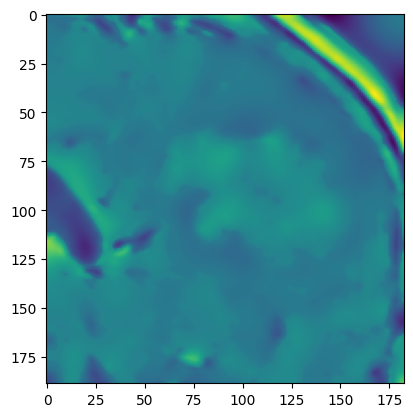

In [ ]:
MSRB_MST_rho = list(zip(*rho_dict['MST']))
MST_img = MST(img_to_run, MSRB_MST_rho)
plt.imshow(MST_img)

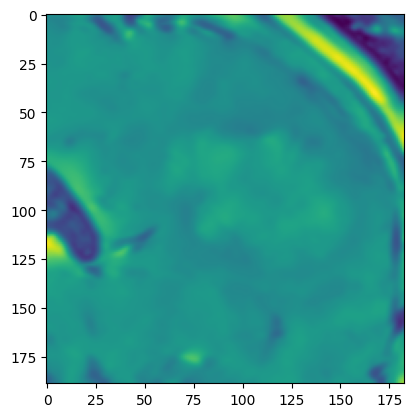

In [ ]:
MSRB_MST_rho = list(zip(*rho_dict['MSRB']))
MSRB_img= MSRB(img_to_run, MSRB_MST_rho)
plt.imshow(MSRB_img)

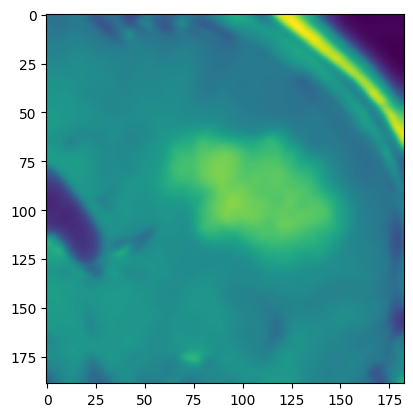

In [ ]:
MSB_img = MSB(img_to_run, rho_dict['MSB'])
plt.imshow(MSB_img)

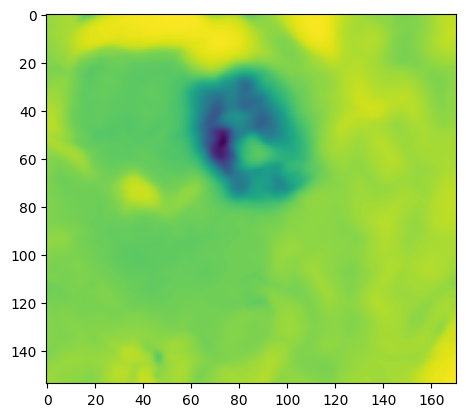

In [ ]:
local_var_img = MSLV(img_to_run, rho_dict['MSLV'])
plt.imshow(local_var_img)

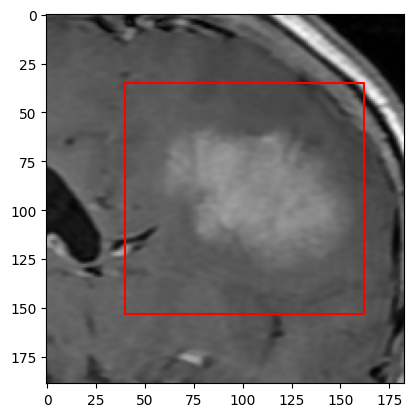

In [ ]:
LSF = init_LSF
img_to_show = skimage.exposure.rescale_intensity(img_to_run, out_range=np.uint8)
plt.figure()
plt.imshow(img_to_show, cmap='gray')
contours = plt.contour(init_LSF, [0.0], colors='r')
#plt.setp(contours.collections, linewidth=2)  # Set linewidth for contours
plt.show(block=False)

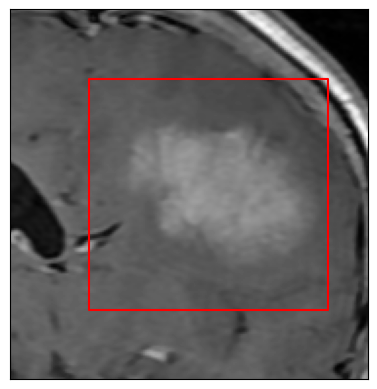

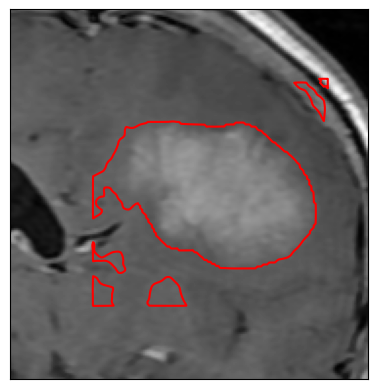

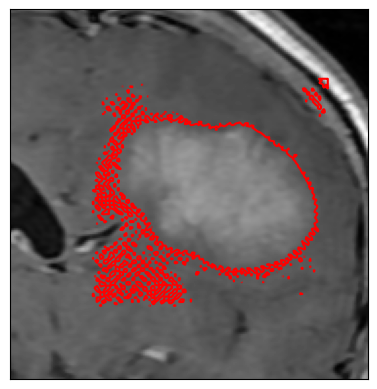

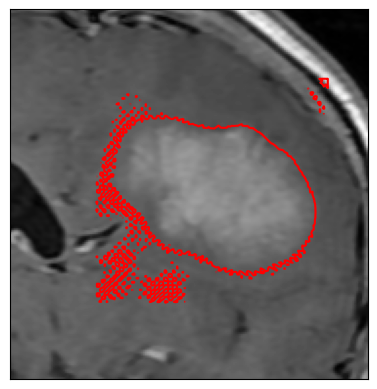

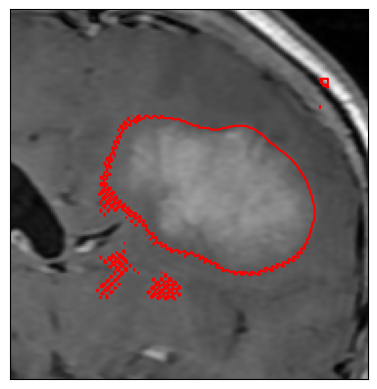

...

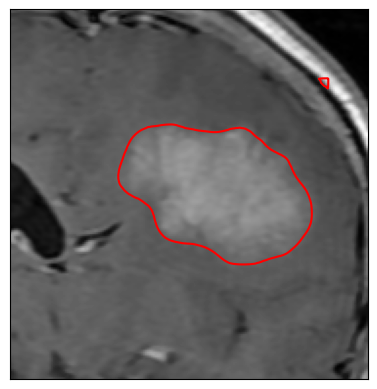

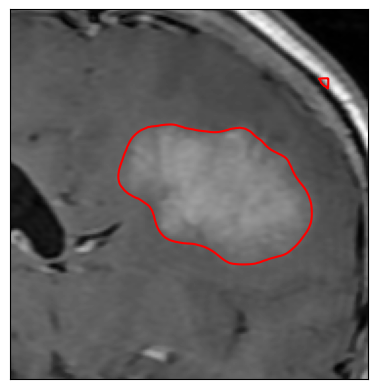

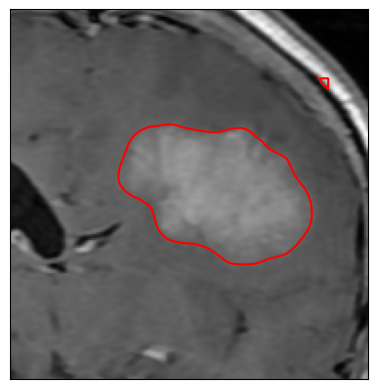

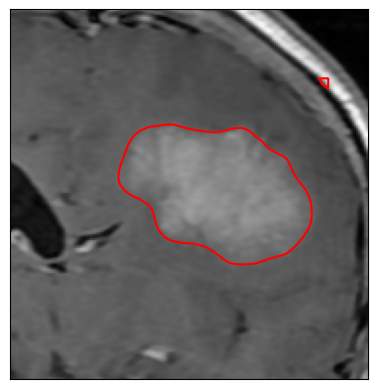

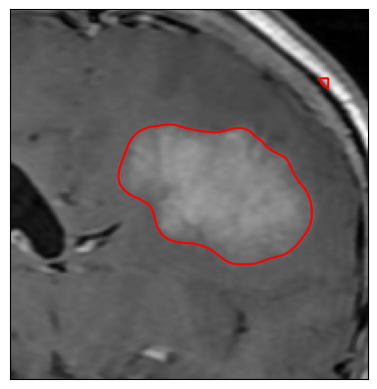

In [ ]:



# Perform the level set evolution
LSF = mod_test(LSF, img_to_show, img_to_run, step_size, epsilon, mu, rho_dict, lambda_dict, num)

In [ ]:
LSF = post_processig(LSF, y_mid, x_mid, 5)
LSF = LSF.astype(np.float64)
LSF[LSF==0] = -10

In [ ]:

LSF[LSF<0]=-10
kernel = np.ones((5, 5))
LSF = cv2.erode(LSF, kernel)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
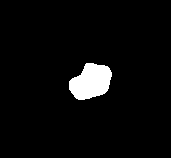

In [ ]:
skimage.exposure.rescale_intensity(LSF, out_range=np.uint8)

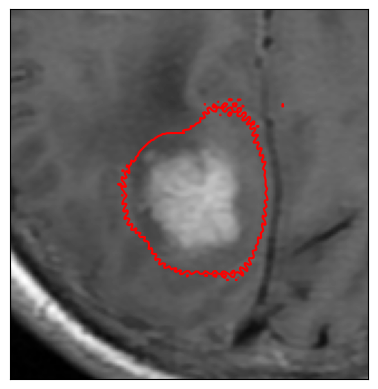

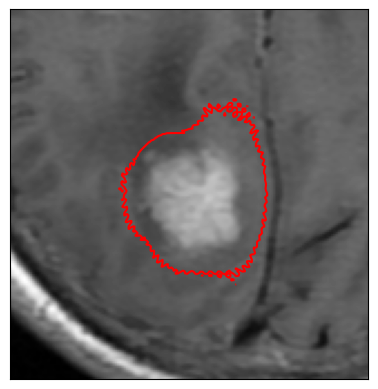

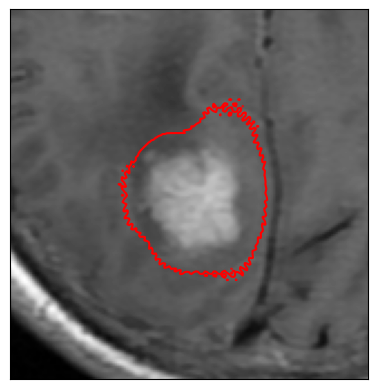

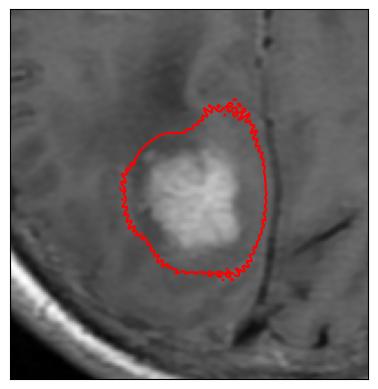

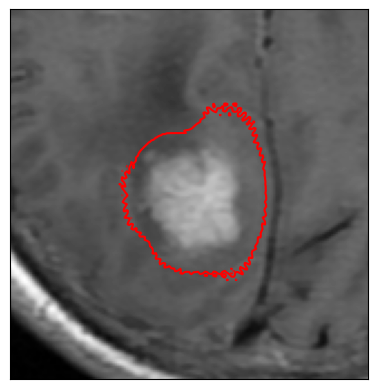

...

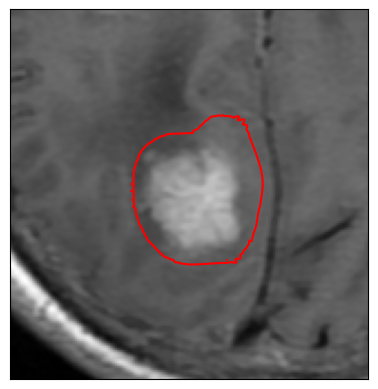

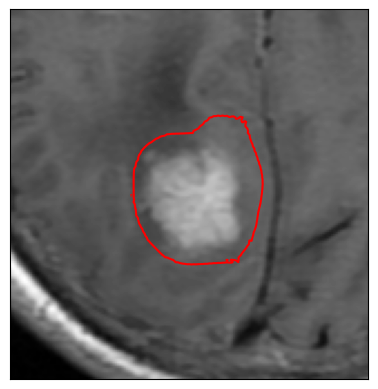

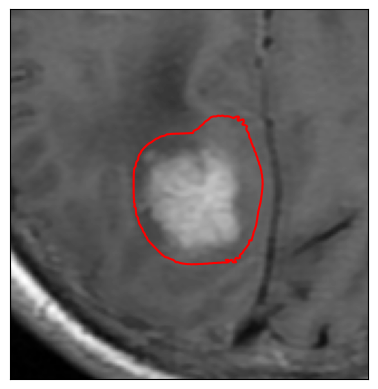

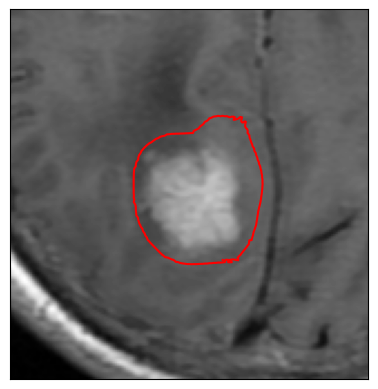

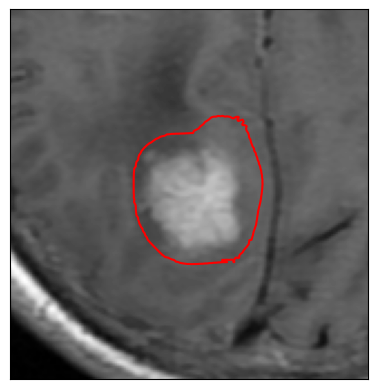

In [ ]:
LSF = mod_test(LSF, img_to_show, img_to_run, 1, epsilon, mu, rho_dict, lambda_dict, 50)

##Post processing

In [ ]:
def post_processig(LSF, x, y, D):
  contours_img = (LSF >= 0).astype(np.uint8)
  contours_img = skimage.morphology.closing(contours_img, footprint=np.ones((D, D)))

  kernel = np.ones((D, D))
  erode_img = cv2.erode((contours_img>0).astype(np.uint8), kernel)

  # eroding and dropping the non-relevant contours
  erode_drop_img = erode_drop(erode_img, x, y, D)
  return erode_drop_img

In [ ]:
def erode_drop(img, x, y, D):
  # Creating kernel
  kernel = np.ones((D, D))

  # Using cv2.erode() method
  erode_img = cv2.erode(img, kernel)

  # finding the different cotnours
  contours =  skimage.measure.label(img)
  main_contour_color = contours[x,y]
  erode_img[contours != main_contour_color] = 0
  erode_img[contours == main_contour_color] = 1
  erode_img = cv2.dilate(erode_img, kernel)
  return erode_img

#Results

eval

In [ ]:
#LSF = post_processig(LSF, y_mid, x_mid, 5)
out_mask = LSF>0

In [ ]:
zero_mask = np.zeros_like(mask)
zero_mask[y_min-60:y_max+60, x_min-60:x_max+60] = out_mask
out_mask = zero_mask

In [ ]:
thershold_bone = skimage.filters.threshold_otsu(image, np.max(image))
thershold_img = (image < thershold_bone).astype(np.uint8)*255
kernel = np.ones((3, 3))
im_er = cv2.dilate(thershold_img, kernel)
diff_val =  skimage.measure.label(im_er)
re_img = skimage.exposure.rescale_intensity(image, out_range=np.uint8)
#re_img[diff_val==1] = 0

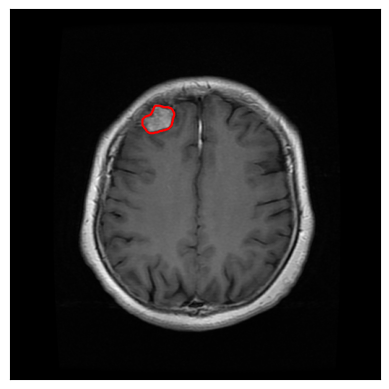

In [ ]:
plt.imshow(re_img, cmap="gray")
plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
plt.contour(out_mask, [0], colors='r')
plt.show(block=False)

##Metrics

### eval metrics

In [ ]:
from sklearn.metrics import f1_score, jaccard_score, recall_score, precision_score, accuracy_score

def calculate_metrics(y_true, y_pred):
    # Ensure the tensors are on CPU and convert to numpy arrays
    y_true = y_true.flatten().astype('uint8')
    y_pred = y_pred.flatten().astype('uint8')

    # Compute F1 score and Jaccard index using scikit-learn
    f1 = f1_score(y_true, y_pred)
    jaccard = jaccard_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)


    #add more metrics

    metrics = {
        'F1 Score': f1,
        'Jaccard Index': jaccard,
        'Recall': recall,
        'Precision': precision,
        'Accuracy': accuracy
    }

    return metrics

In [ ]:
def round_metrics(metrics):
  for k,v in metrics.items():
    metrics[k] = round(v, 4)
  return metrics

In [ ]:
from statistics import mean
metrics = calculate_metrics(mask, out_mask)
for k,v in metrics.items():
  print(f"'{k}': {v},")

'F1 Score': 0.8545526212061489,
'Jaccard Index': 0.7460426703372333,
'Recall': 0.7737330478229836,
'Precision': 0.954225352112676,
'Accuracy': 0.9985923767089844,


###plot metrics


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def plot_metrics_table(Deep_learning_metrics, Level_Set_metrics):
    # Ensure both dictionaries have the same keys
    if Deep_learning_metrics.keys() != Level_Set_metrics.keys():
        raise ValueError("Both dictionaries must have the same keys")

    # Create a DataFrame
    df = pd.DataFrame([Deep_learning_metrics, Level_Set_metrics])
    df.insert(0, 'Method', ['SAM for \n brain tumors', 'Level-Set'])

    # Define colors for table background and text
    table_colors = ['#f2f2f2', '#ffffff']  # Alternating row colors
    col_color = '#f0bb59'  # Color for the column header cells
    header_text_color = '#000000'  # Text color for the header
    cell_text_color = '#000000'  # Text color for the cells

    # Plot the table
    fig, ax = plt.subplots(figsize=(7, len(df)*0.5))  # Adjust figsize based on the number of rows
    ax.axis('tight')
    ax.axis('off')

    # Create the table
    table = ax.table(cellText=df.values, colLabels=df.columns,
                     cellLoc='center', loc='center',
                     colColours=[col_color] * len(df.columns))

    # Set the font size and color
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.5, 1.5)

    # Set colors for the header and cells
    for i, key in enumerate(df.columns):
        table[0, i].set_text_props(color=header_text_color, weight='bold', va='center_baseline')
        table[1, i].set_facecolor(table_colors[i % 2])
        table[2, i].set_facecolor(table_colors[i % 2])
        table[1, i].set_height(0.55)
        if i == 0:
          table[1, i].set_text_props(color=cell_text_color, weight='bold', va='center_baseline')
          table[2, i].set_text_props(color=cell_text_color, weight='bold', va='center_baseline')
        else:
          table[1, i].set_text_props(color=cell_text_color, va='center_baseline')
          table[2, i].set_text_props(color=cell_text_color, va='center_baseline')


   # Add title
    ax.set_title('Metrics', fontweight='bold', fontsize=16, pad=15)

    # Adjust layout to bring the title right above the table
    plt.subplots_adjust(top=0.95, bottom=0.05)

    plt.show()

In [ ]:
Deep_learning_metrics = {

'F1 Score': 0.8489608728342525,
'Jaccard Index': 0.8025709842810633,
'Recall': 0.811861732813093,
'Precision': 0.9867077994878143,
'Accuracy': 0.9981188456217448


}

Level_Set_metrics = {
'F1 Score': 0.8863,
'Jaccard Index': 0.8354,
'Recall': 0.8471,
'Precision': 0.9671,
'Accuracy': 0.9734
}

Deep_learning_metrics = round_metrics(Deep_learning_metrics)
Level_Set_metrics = round_metrics(Level_Set_metrics)

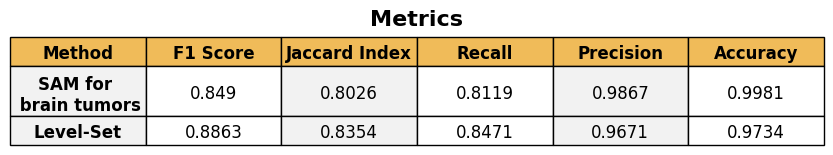

In [ ]:
plot_metrics_table(Deep_learning_metrics, Level_Set_metrics)

In [ ]:
!pip install rlextra -i https://www.reportlab.com/pypi/

##Curve evolution video

In [ ]:
# Compressed video path
save_path = "segmentation_video.mp4"
compressed_path = "segmentation_video_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

0

In [ ]:
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)